# Evaluate oof
---

In [1]:
# ===============
# libraries
# ===============
import os, gc, yaml, glob, pickle
import time
import random
import math
from pathlib import Path
from typing import Dict, List, Tuple
from types import SimpleNamespace

import numpy as np
import polars as pl
import pandas as pd
from tqdm import tqdm

import matplotlib.pyplot as plt
from PIL import Image

import warnings
# warnings.filterwarnings('ignore')

# original
import sys
sys.path.append("../src")
from utils.data import sep, show_df, glob_walk, set_seed, save_config_yaml, dict_to_namespace
from utils.metric import global_weighted_r2_score, r2_per_target

from datetime import datetime
date = datetime.now().strftime("%Y%m%d")
print(f"TODAY is {date}")

TODAY is 20251231


In [2]:
# ============================
# set experimental
# ============================
EXP = "101_train_exp014"

# ===============
# Config
# ===============
exp_dir = Path("/mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction") / "experiments" / EXP

# config 読み込み
cfg_path = exp_dir / "yaml" / "config.yaml"
if not cfg_path.exists():
    raise FileNotFoundError(f"config.yaml not found: {cfg_path}")

with open(cfg_path, "r") as f:
    cfg = yaml.safe_load(f)


folds = cfg["folds"]

In [3]:
# save_path = exp_dir / f"oof_fold{fold}"
# os.makedirs(save_path, exist_ok=True)

In [4]:
# ================
# load df_folds
# ================
pp_dir = Path(cfg["pp_dir"])
data_ppdir = pp_dir / cfg["preprocess_ver"]
df_pivot = pl.read_csv(data_ppdir / "df_pivot.csv")
sep("df_pivot"); show_df(df_pivot)

df_pivot
(357, 35)


image_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,Dry_Clover_g,Dry_Dead_g,Dry_Green_g,Dry_Total_g,GDM_g,date,year,month,day,weekday,weekday_name,is_BarleyGrass,is_Barleygrass,is_Bromegrass,is_Capeweed,is_Clover,is_CrumbWeed,is_Fescue,is_Lucerne,is_Mixed,is_Phalaris,is_Ryegrass,is_SilverGrass,is_SpearGrass,is_SubcloverDalkeith,is_SubcloverLosa,is_WhiteClover,Fold
str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64,str,i64,i64,i64,i64,str,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,i64
"""ID1011485656""","""train/ID1011485656.jpg""","""2015/9/4""","""Tas""","""Ryegrass_Clover""",0.62,4.6667,0.0,31.9984,16.2751,48.2735,16.275,"""2015-09-04""",2015,9,4,5,"""Fri""",false,false,false,false,true,false,false,false,false,false,true,false,false,false,false,false,4
"""ID1012260530""","""train/ID1012260530.jpg""","""2015/4/1""","""NSW""","""Lucerne""",0.55,16.0,0.0,0.0,7.6,7.6,7.6,"""2015-04-01""",2015,4,1,3,"""Wed""",false,false,false,false,false,false,false,true,false,false,false,false,false,false,false,false,1
"""ID1025234388""","""train/ID1025234388.jpg""","""2015/9/1""","""WA""","""SubcloverDalkeith""",0.38,1.0,6.05,0.0,0.0,6.05,6.05,"""2015-09-01""",2015,9,1,2,"""Tue""",false,false,false,false,false,false,false,false,false,false,false,false,false,true,false,false,2


In [5]:
# ==========================
# OOF 読み込み
# ==========================
ids = []
folds = []
N = 0

for i, fold in enumerate(cfg["folds"]):
    oof_path = exp_dir / "oof" / f"oof_fold{fold}.npz"
    if not oof_path.exists():
        raise FileNotFoundError(f"OOF file not found: {oof_path}")

    oof = np.load(oof_path)
    _ids = oof["ids"]        # (N,)
    _folds = [i] * len(_ids)
    _preds = oof["preds"]    # (N,F)
    _targets = oof["targets"]  # (N,F)
    _preds_log = oof["preds_log"]  # (N,F)
    _targs_log = oof["targets_log"]  # (N,F)

    target_cols = cfg["target_cols"]

    N += len(_ids)
    if N == 0:
        print(f"[WARN] OOF is empty at {oof_path}")
        
    print(f"[INFO] Loaded OOF: {oof_path}")
    print(f"[INFO] N samples: {N}")

    ids.extend(_ids)
    folds.extend(_folds)
    if i ==0:
        preds = _preds
        targets = _targets
        preds_log = _preds_log
        targs_log = _targs_log
    else:
        preds = np.concatenate((preds, _preds), axis=0)
        targets = np.concatenate((targets, _targets), axis=0)
        preds_log = np.concatenate((preds_log, _preds_log), axis=0)
        targs_log = np.concatenate((targs_log, _targs_log), axis=0)
ids = np.array(ids)
folds = np.array(folds)

[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/101_train_exp014/oof/oof_fold0.npz
[INFO] N samples: 61
[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/101_train_exp014/oof/oof_fold1.npz
[INFO] N samples: 147
[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/101_train_exp014/oof/oof_fold2.npz
[INFO] N samples: 235
[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/101_train_exp014/oof/oof_fold3.npz
[INFO] N samples: 295
[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/101_train_exp014/oof/oof_fold4.npz
[INFO] N samples: 357


In [6]:
# compute weighted_r2_score
score = global_weighted_r2_score(targets, preds, cfg["metric"]["weights"])
print(f"[INFO] Weighted R2 Score: {score:.3f}")

[INFO] Weighted R2 Score: 0.643


In [7]:
preds_fix = preds.copy()
preds_fix[:, 3] = preds_fix[:, 0] + preds_fix[:, 1]              # GDM = Green + Clover
preds_fix[:, 4] = preds_fix[:, 0] + preds_fix[:, 1] + preds_fix[:, 2]  # Total = Green + Clover + Dead

r2_before = global_weighted_r2_score(targets, preds, cfg["metric"]["weights"])
r2_after  = global_weighted_r2_score(targets, preds_fix, cfg["metric"]["weights"])
print("before:", r2_before, "after:", r2_after)

before: 0.643494310048961 after: 0.6434943078143159


In [8]:
pred_df = pl.DataFrame(
    {
        "image_id": ids,
        "fold": folds,
        "preds_Dry_Green_g": preds[:, 0],
        "preds_Dry_Clover_g": preds[:, 1],
        "preds_Dry_Dead_g": preds[:, 2],
        "preds_GDM_g": preds[:, 3],
        "preds_Dry_Total_g": preds[:, 4],
        "targets_Dry_Green_g": targets[:, 0],
        "targets_Dry_Clover_g": targets[:, 1],
        "targets_Dry_Dead_g": targets[:, 2],
        "targets_GDM_g": targets[:, 3],
        "targets_Dry_Total_g": targets[:, 4],
        "preds_log_Dry_Green_g": preds_log[:, 0],
        "preds_log_Dry_Clover_g": preds_log[:, 1],
        "preds_log_Dry_Dead_g": preds_log[:, 2],
        "preds_log_GDM_g": preds_log[:, 3],
        "preds_log_Dry_Total_g": preds_log[:, 4],
        "targets_log_Dry_Green_g": targs_log[:, 0],
        "targets_log_Dry_Clover_g": targs_log[:, 1],
        "targets_log_Dry_Dead_g": targs_log[:, 2],
        "targets_log_GDM_g": targs_log[:, 3],
        "targets_log_Dry_Total_g": targs_log[:, 4],
    }
)
show_df(pred_df)

(357, 22)


image_id,fold,preds_Dry_Green_g,preds_Dry_Clover_g,preds_Dry_Dead_g,preds_GDM_g,preds_Dry_Total_g,targets_Dry_Green_g,targets_Dry_Clover_g,targets_Dry_Dead_g,targets_GDM_g,targets_Dry_Total_g,preds_log_Dry_Green_g,preds_log_Dry_Clover_g,preds_log_Dry_Dead_g,preds_log_GDM_g,preds_log_Dry_Total_g,targets_log_Dry_Green_g,targets_log_Dry_Clover_g,targets_log_Dry_Dead_g,targets_log_GDM_g,targets_log_Dry_Total_g
str,i64,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32
"""ID1035947949""",0,13.632812,1.209109,12.023442,14.841923,26.865364,10.526099,0.4343,23.223902,10.960501,34.184395,2.683266,0.792589,2.566751,2.76266,3.327384,2.444614,0.360677,3.18734,2.48161,3.560603
"""ID105271783""",0,37.656246,5.287635,16.656252,42.943882,59.600136,27.666702,5.2698,8.563501,32.936497,41.5,3.654708,1.838585,2.87109,3.782913,4.104297,3.355736,1.835745,2.257954,3.524491,3.749504
"""ID1103883611""",0,49.437496,1.605469,20.802338,51.042973,71.845314,82.783417,0.0,12.9166,82.783417,95.699989,3.920735,0.957613,3.082017,3.95207,4.288338,4.428235,0.0,2.633082,4.428235,4.571613


In [9]:
import numpy as np
import matplotlib.pyplot as plt
from typing import List, Optional, Sequence, Dict, Tuple


def _prepare_xy_for_scatter(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    *,
    space: str,
    clip_min: float = 0.0,
    log_clip_min: float = -20.0,
    log_clip_max: float = 20.0,
) -> Tuple[np.ndarray, np.ndarray]:
    """散布図用に (x, y) を整形する。

    Args:
        y_true: (N,) 真値
        y_pred: (N,) 予測
        space: "raw" or "log1p"
            - "raw"  : raw(g)を受け取り、表示は log1p(clip(raw)) に変換
            - "log1p": すでに log1p 空間を受け取り、そのまま表示（※二重log防止）
        clip_min: raw空間の下限クリップ（質量なので通常 0）
        log_clip_min/log_clip_max: log空間の安全クリップ（expm1等でinfを防ぐ用途だが、ここでは表示の安定化）

    Returns:
        x, y: 散布図に使う (N,)
    """
    if space not in ("raw", "log1p"):
        raise ValueError(f"space must be 'raw' or 'log1p', got: {space}")

    if space == "raw":
        x = np.log1p(np.clip(y_true, clip_min, None))
        y = np.log1p(np.clip(y_pred, clip_min, None))
        return x, y

    # log1p空間はそのまま（必要ならクリップ）
    x = np.clip(y_true, log_clip_min, log_clip_max)
    y = np.clip(y_pred, log_clip_min, log_clip_max)
    return x, y


def plot_scatter_grid(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    target_cols: List[str],
    *,
    folds: Optional[np.ndarray] = None,
    space: str = "raw",
    nrows: int = 2,
    ncols: int = 3,
    s: float = 10.0,
    alpha: float = 0.55,
    sample_per_fold: Optional[int] = None,
    show_legend: bool = True,
    title_prefix: str = "OOF scatter",
) -> None:
    """ターゲット別散布図を 2x3 で可視化（fold色分け対応）.

    🧠 使いどころ:
      - fold0/2だけ分布が違う・ズレる、などを一瞬で発見できます。

    Args:
        y_true: (N,K) 真値
        y_pred: (N,K) 予測
        target_cols: K個のターゲット名
        folds: (N,) fold番号。Noneなら色分けなし
        space: "raw" or "log1p"
        nrows/ncols: subplotの配置
        s/alpha: scatterの見た目
        sample_per_fold: foldごとに点数を間引く（大規模データで重い時用）
        show_legend: 凡例を図に出すか（図がうるさくなるならFalse）
        title_prefix: タイトル接頭辞

    Returns:
        None
    """
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    assert y_true.shape == y_pred.shape, "y_true と y_pred のshapeが一致しません"
    assert y_true.shape[1] == len(target_cols), "target_cols と列数が一致しません"

    n, k = y_true.shape

    if folds is not None:
        folds = np.asarray(folds).astype(int)
        assert len(folds) == n, "folds の長さが N と一致しません"
        fold_values = np.unique(folds)
        fold_values = np.sort(fold_values)
    else:
        fold_values = None

    # --- Figure準備 ---
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 4), squeeze=False)
    axes_flat = axes.ravel()

    # foldごとの色は matplotlib のtab10を使って安定化（手指定はしない）
    cmap = plt.get_cmap("tab10")

    # 凡例は図全体で1回だけ作る（subplotごとにlegendを出すと見づらい＆重い）
    legend_handles = None
    legend_labels = None

    for j, t in enumerate(target_cols):
        ax = axes_flat[j]

        yt = y_true[:, j]
        yp = y_pred[:, j]

        # 表示空間を整形（raw->log1p / log1pはそのまま）
        x_all, y_all = _prepare_xy_for_scatter(yt, yp, space=space)

        # --- fold色分け ---
        if fold_values is not None:
            handles = []
            labels = []
            for fi, f in enumerate(fold_values):
                m = (folds == f)
                if not np.any(m):
                    continue

                x = x_all[m]
                y = y_all[m]

                # 重い時はfoldごとにサンプリング（再現性は不要なのでランダムOK）
                if sample_per_fold is not None and len(x) > sample_per_fold:
                    idx = np.random.choice(len(x), size=int(sample_per_fold), replace=False)
                    x = x[idx]
                    y = y[idx]

                sc = ax.scatter(x, y, s=s, alpha=alpha, color=cmap(fi % 10), label=f"fold{int(f)}")
                handles.append(sc)
                labels.append(f"fold{int(f)}")

            if legend_handles is None:
                legend_handles, legend_labels = handles, labels

        else:
            ax.scatter(x_all, y_all, s=s, alpha=alpha)

        # y=x の線（このsubplot内の範囲に合わせる）
        mn = float(min(np.min(x_all), np.min(y_all)))
        mx = float(max(np.max(x_all), np.max(y_all)))
        ax.plot([mn, mx], [mn, mx])

        ax.set_title(f"{title_prefix} ({space}): {t}")
        ax.set_xlabel("x=true")
        ax.set_ylabel("y=pred")
        ax.grid(True, alpha=0.2)

    # 余った枠を消す
    for kk in range(len(target_cols), nrows * ncols):
        fig.delaxes(axes_flat[kk])

    if show_legend and legend_handles is not None:
        fig.legend(
            legend_handles,
            legend_labels,
            loc="upper center",
            ncol=min(5, len(legend_labels)),
            frameon=False,
        )

    fig.tight_layout()
    plt.show()

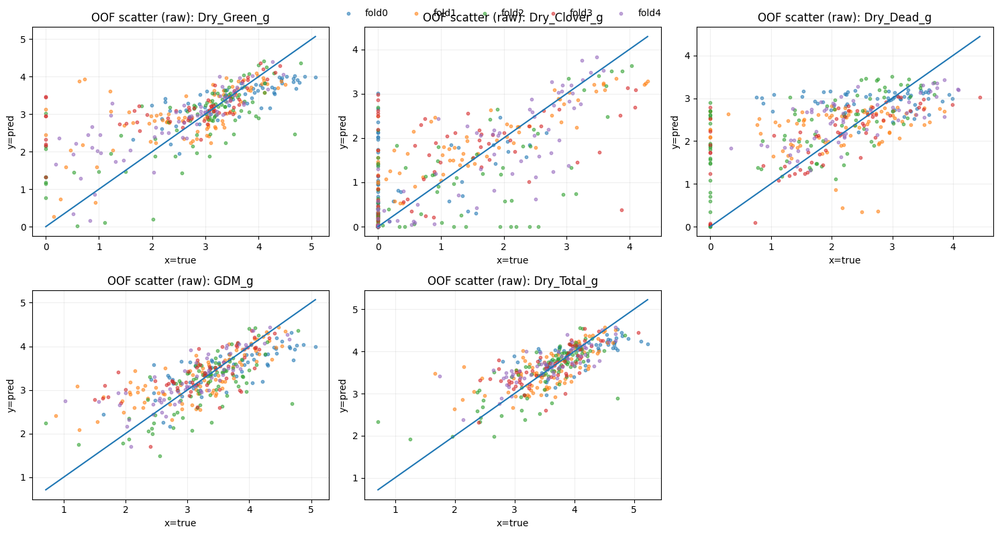

In [10]:
plot_scatter_grid(
    y_true=targets,
    y_pred=preds,
    target_cols=target_cols,
    folds=folds,         # ← これを渡すと色分け
    space="raw",         # ← rawを渡すなら raw
    nrows=2,
    ncols=3,
    show_legend=True,
)

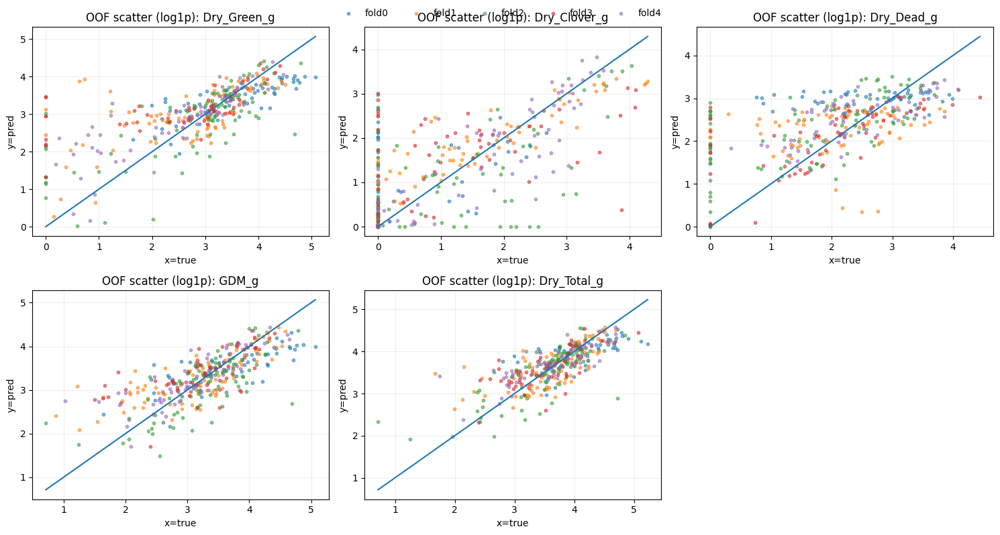

In [11]:
plot_scatter_grid(
    y_true=targs_log,
    y_pred=preds_log,
    target_cols=target_cols,
    folds=folds,
    space="log1p",       # ← これ重要
    nrows=2,
    ncols=3,
    show_legend=True,
)

In [16]:
import numpy as np
import pandas as pd
import polars as pl
from typing import List, Optional, Dict, Any, Tuple


def build_image_score_df(
    ids: np.ndarray,
    folds: np.ndarray,
    targets: np.ndarray,
    preds: np.ndarray,
    weights: List[float],
    target_cols: List[str],
    df_pivot_pl: pl.DataFrame,
    *,
    presence_targets: Optional[List[str]] = None,
    presence_threshold_g: float = 0.0,
    eps: float = 1e-12,
) -> pd.DataFrame:
    """OOFから画像単位の診断スコアを作る（r2_imgは使わない版）.

    ✅ 目的:
      - “どの画像が global weighted R2 を悪化させているか” を見つける
      - hurdle の presence 問題（真の0に対して予測>0 など）を掘る

    計算する主な列:
      - weighted_sse_img: Σ w*(err^2)
      - impact_on_global_r2: weighted_sse_img / SST_total
        （この画像が完璧ならR2がどれだけ改善しうるかの近似）
      - weighted_mae_img: Σ w*|err|
      - dominant_target: その画像で誤差寄与が最大のターゲット
      - presence_fp_count / presence_fn_count: 0/非0判定のミス数（主に最初の3成分向け）

    Args:
        ids: (N,) image_id
        folds: (N,) fold番号
        targets: (N,K) 真値（rawスケール）
        preds: (N,K) 予測（rawスケール）
        weights: (K,) 公式の重み
        target_cols: (K,) ターゲット名
        df_pivot_pl: メタ情報のpolars df（image_path, State, Sampling_Date など）
        presence_targets: presence判定を評価したいターゲット名（Noneなら先頭3つを推奨）
        presence_threshold_g: “存在” とみなす閾値（0.0〜0.2くらいを探索すると良い）
        eps: ゼロ割り防止

    Returns:
        score_df: pandas DataFrame
    """
    ids = np.asarray(ids).astype(str)
    folds = np.asarray(folds).astype(int)
    targets = np.asarray(targets, dtype=np.float64)
    preds = np.asarray(preds, dtype=np.float64)
    weights = np.asarray(weights, dtype=np.float64)

    n, k = targets.shape
    assert preds.shape == targets.shape, "preds/targets shape mismatch"
    assert len(target_cols) == k, "target_cols length mismatch"
    assert len(weights) == k, "weights length mismatch"
    assert len(ids) == n and len(folds) == n, "ids/folds length mismatch"

    # -------------------------
    # 1) 基本誤差（per-image）
    # -------------------------
    err = preds - targets
    abs_err = np.abs(err)
    sq_err = err ** 2

    wsq_err = sq_err * weights[None, :]  # (N,K) ・・・各ターゲットの重み付き二乗誤差
    wabs_err = abs_err * weights[None, :]

    weighted_sse_img = np.sum(wsq_err, axis=1)  # (N,)
    weighted_mae_img = np.sum(wabs_err, axis=1)  # (N,)

    # -------------------------
    # 2) “global weighted R2 に対する影響度” を近似
    #    R2 = 1 - SSE_total / SST_total
    #    SST_totalは固定なので、SSE_i / SST_total が「改善余地」になる
    # -------------------------
    # 公式の global mean（あなたのglobal_weighted_r2の実装に合わせる形）
    mu = float(np.sum(targets * weights[None, :]) / (n * np.sum(weights)))
    sst_total = float(np.sum(weights[None, :] * (targets - mu) ** 2))

    impact_on_global_r2 = weighted_sse_img / max(sst_total, eps)

    # -------------------------
    # 3) どのターゲットが支配的に悪いか（dominant）
    # -------------------------
    dominant_idx = np.argmax(wsq_err, axis=1)  # (N,)
    dominant_target = [target_cols[i] for i in dominant_idx]
    dominant_wsse = wsq_err[np.arange(n), dominant_idx]

    # -------------------------
    # 4) presence診断（ゼロ過剰対策）
    # -------------------------
    if presence_targets is None:
        # 通常は3成分（Green/Clover/Dead）を見るのが良い
        presence_targets = target_cols[:3]

    presence_indices = [target_cols.index(t) for t in presence_targets if t in target_cols]

    if len(presence_indices) > 0:
        thr = float(presence_threshold_g)
        true_pos = targets[:, presence_indices] > thr
        pred_pos = preds[:, presence_indices] > thr

        # FP: true=0 なのに pred>0（縦線の主因になりやすい）
        fp = (~true_pos) & (pred_pos)
        fn = (true_pos) & (~pred_pos)

        presence_fp_count = np.sum(fp, axis=1).astype(int)
        presence_fn_count = np.sum(fn, axis=1).astype(int)

        # FP/FN “どの成分で” 間違ったか（軽い診断用）
        fp_any = np.any(fp, axis=1)
        fn_any = np.any(fn, axis=1)
    else:
        presence_fp_count = np.zeros(n, dtype=int)
        presence_fn_count = np.zeros(n, dtype=int)
        fp_any = np.zeros(n, dtype=bool)
        fn_any = np.zeros(n, dtype=bool)

    # -------------------------
    # 5) DataFrame化
    # -------------------------
    score_df = pd.DataFrame(
        {
            "image_id": ids,
            "fold": folds,
            "row_idx": np.arange(n, dtype=np.int64),
            # main scores（これが重要✨）
            "weighted_sse_img": weighted_sse_img.astype(np.float64),
            "impact_on_global_r2": impact_on_global_r2.astype(np.float64),
            "weighted_mae_img": weighted_mae_img.astype(np.float64),
            # diagnostics
            "dominant_target": dominant_target,
            "dominant_wsse": dominant_wsse.astype(np.float64),
            "presence_fp_count": presence_fp_count,
            "presence_fn_count": presence_fn_count,
            "presence_fp_any": fp_any.astype(bool),
            "presence_fn_any": fn_any.astype(bool),
        }
    )

    # ターゲット別の寄与も残す（分析に便利）
    for j, t in enumerate(target_cols):
        score_df[f"true_{t}"] = targets[:, j]
        score_df[f"pred_{t}"] = preds[:, j]
        score_df[f"err_{t}"] = err[:, j]
        score_df[f"abs_err_{t}"] = abs_err[:, j]
        score_df[f"wsse_{t}"] = wsq_err[:, j]

    # メタ情報join
    meta_cols = [c for c in ["image_id", "image_path", "Pre_GSHH_NDVI", "Height_Ave_cm", "State", "Sampling_Date", "Species"] if c in df_pivot_pl.columns]
    meta_pd = df_pivot_pl.select(meta_cols).to_pandas()
    score_df = score_df.merge(meta_pd, on="image_id", how="left")

    # 表示用ラベル（画像一覧で便利）
    score_df["label"] = score_df.apply(
        lambda r: f"{r['image_id']} | fold{int(r['fold'])} | wsse={r['weighted_sse_img']:.2f}",
        axis=1,
    )

    return score_df

In [17]:
weights = cfg["metric"]["weights"]
score_df = build_image_score_df(
    ids=ids,
    folds=folds,
    targets=targets,
    preds=preds,
    weights=weights,
    target_cols=target_cols,
    df_pivot_pl=df_pivot,
    presence_threshold_g=float(cfg.get("loss", {}).get("presence_threshold_g", 0.0)) if isinstance(cfg, dict) else 0.0,
)

In [18]:
def plot_image_and_bars_grid(
    subset_df: pd.DataFrame,
    preds: np.ndarray,
    targets: np.ndarray,
    target_cols: List[str],
    input_dir: str,
    title_prefix: str,
    use_log1p_y: bool = False,
    score_col: str = "weighted_sse_img",
) -> None:
    """Nx2（左=画像、右=target/pred棒グラフ）で可視化する.

    Args:
        subset_df: score_df の部分集合（row_idx を含む必要あり）
        preds, targets: (N,K)
        target_cols: ターゲット名
        input_dir: rawデータroot
        title_prefix: "BEST" / "WORST" など
        use_log1p_y: 棒グラフのyをlog1p表示
        score_col: タイトルに出すスコア列名（例: weighted_sse_img）
    """
    n = len(subset_df)
    if n == 0:
        print("[WARN] subset_df is empty.")
        return

    fig, axes = plt.subplots(n, 2, figsize=(14, 4 * n), squeeze=False)

    x = np.arange(len(target_cols))
    width = 0.35

    for i, row in enumerate(subset_df.itertuples(index=False)):
        idx = int(row.row_idx)
        image_id = str(row.image_id)
        fold = int(row.fold)
        score_val = float(getattr(row, score_col))

        # --- 左: 画像 ---
        ax_img = axes[i, 0]
        img_path = Path(input_dir) / str(row.image_path)
        img = Image.open(img_path).convert("RGB")
        ax_img.imshow(img)
        ax_img.axis("off")
        ax_img.set_title(f"{title_prefix}{i+1}: {image_id} Fold{fold} | {score_col}={score_val:.2f}")

        # --- 右: 棒グラフ ---
        ax_bar = axes[i, 1]
        y_true = targets[idx].copy()
        y_pred = preds[idx].copy()

        if use_log1p_y:
            y_true_plot = np.log1p(np.clip(y_true, 0, None))
            y_pred_plot = np.log1p(np.clip(y_pred, 0, None))
            ax_bar.set_ylabel("log1p(g)")
        else:
            y_true_plot = y_true
            y_pred_plot = y_pred
            ax_bar.set_ylabel("g")

        ax_bar.bar(x - width / 2, y_true_plot, width, label="target")
        ax_bar.bar(x + width / 2, y_pred_plot, width, label="pred")

        ax_bar.set_xticks(x)
        ax_bar.set_xticklabels(target_cols, rotation=45, ha="right")
        ax_bar.grid(True, axis="y", alpha=0.25)
        ax_bar.legend()

    fig.tight_layout()
    plt.show()

In [19]:
TOP_N = 8
WORST_N = 8

# best: weighted_sse_img が小さい順
best_df = score_df.sort_values("weighted_sse_img", ascending=True).head(TOP_N)

# worst: weighted_sse_img が大きい順
worst_df = score_df.sort_values("weighted_sse_img", ascending=False).head(WORST_N)

show_df(best_df[["image_id", "fold", "Pre_GSHH_NDVI", "Height_Ave_cm", "State", "weighted_sse_img", "impact_on_global_r2", "dominant_target"]], 8)
show_df(worst_df[["image_id", "fold", "Pre_GSHH_NDVI", "Height_Ave_cm", "State", "weighted_sse_img", "impact_on_global_r2", "dominant_target"]], 8)

(8, 8)


,image_id,fold,Pre_GSHH_NDVI,Height_Ave_cm,State,weighted_sse_img,impact_on_global_r2,dominant_target
316,ID1498398599,4,0.36,2.1667,Tas,0.533406,0.000002,GDM_g
305,ID1217108125,4,0.62,2.0000,Tas,0.538132,0.000002,GDM_g
77,ID141370843,1,0.72,4.0000,Vic,0.573231,0.000002,Dry_Green_g
255,ID1655778545,3,0.62,5.0000,NSW,0.623879,0.000002,Dry_Total_g
44,ID560946727,0,0.74,3.6667,Tas,1.195328,0.000004,Dry_Green_g
248,ID1291116815,3,0.76,3.0000,Vic,1.895191,0.000007,Dry_Clover_g
174,ID1665142816,2,0.73,4.0000,Vic,1.988373,0.000007,Dry_Total_g
147,ID1025234388,2,0.38,1.0000,WA,2.591895,0.000009,Dry_Clover_g


(8, 8)


,image_id,fold,Pre_GSHH_NDVI,Height_Ave_cm,State,weighted_sse_img,impact_on_global_r2,dominant_target
39,ID384648061,0,0.85,14.6667,NSW,10701.265076,0.037405,Dry_Total_g
160,ID1357758282,2,0.77,62.0000,NSW,7199.844284,0.025167,Dry_Total_g
54,ID746335827,0,0.75,24.3333,NSW,6075.379371,0.021236,Dry_Total_g
20,ID157479394,0,0.69,37.0000,NSW,3549.036645,0.012405,Dry_Total_g
238,ID1139866256,3,0.66,13.0000,NSW,3131.866729,0.010947,Dry_Total_g
3,ID1121692672,0,0.52,38.0000,NSW,3063.095107,0.010707,Dry_Total_g
17,ID1540480250,0,0.58,20.0000,NSW,2223.376201,0.007772,Dry_Total_g
182,ID1859251563,2,0.83,70.0000,NSW,1659.062399,0.005799,Dry_Total_g


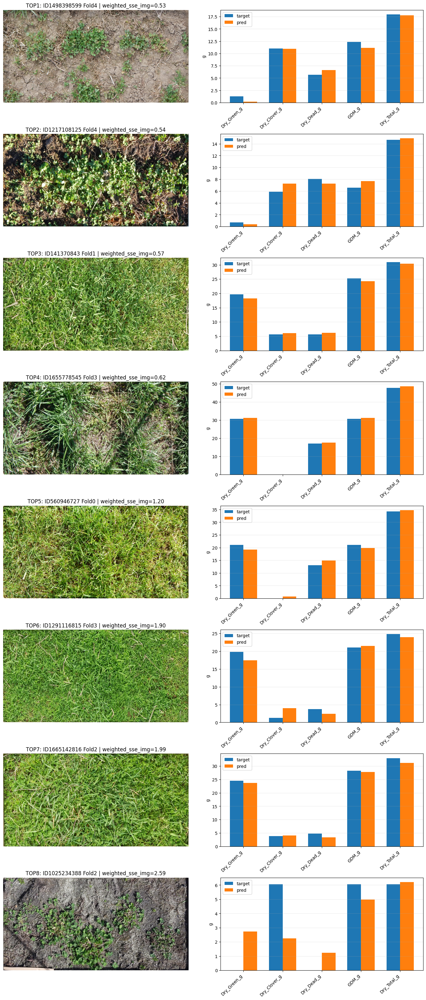

In [20]:
plot_image_and_bars_grid(
    subset_df=best_df,
    preds=preds,
    targets=targets,
    target_cols=target_cols,
    input_dir=cfg["input_dir"],
    title_prefix="TOP",
    use_log1p_y=False,   # Trueにするとスケール差が見やすい
)

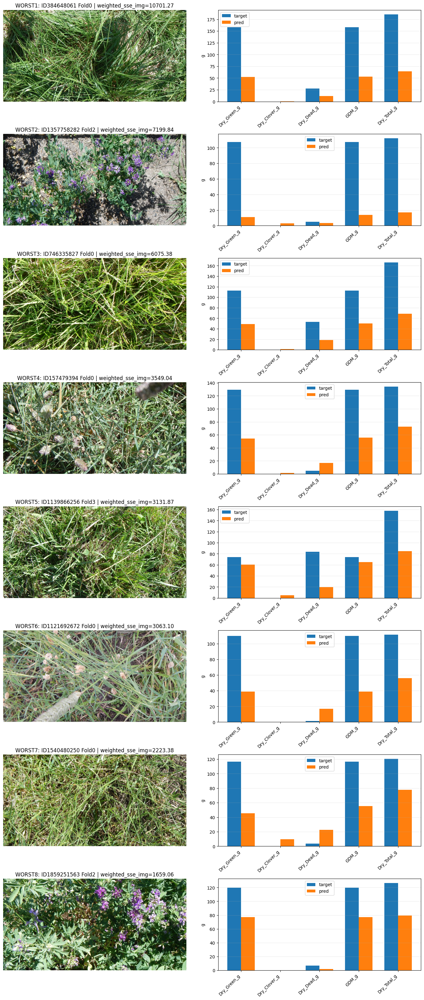

In [21]:
plot_image_and_bars_grid(
    subset_df=worst_df,
    preds=preds,
    targets=targets,
    target_cols=target_cols,
    input_dir=cfg["input_dir"],
    title_prefix="WORST",
    use_log1p_y=False,
)

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import List, Optional


def plot_presence_fp_fn_by_fold(
    score_df: pd.DataFrame,
    component_targets: List[str],
    *,
    threshold: float = 0.0,
) -> pd.DataFrame:
    """fold別に presence の FP/FN を集計し、棒で可視化する。

    Args:
        score_df: build_image_score_df の出力
        component_targets: 例 ["Dry_Green_g","Dry_Clover_g","Dry_Dead_g"]
        threshold: true/pred > threshold を “存在” とみなす

    Returns:
        summary_df: 集計表（fold×target）
    """
    rows = []
    for f, g in score_df.groupby("fold"):
        for t in component_targets:
            yt = g[f"true_{t}"].values
            yp = g[f"pred_{t}"].values
            true_pos = yt > threshold
            pred_pos = yp > threshold

            fp = np.mean((~true_pos) & (pred_pos))
            fn = np.mean((true_pos) & (~pred_pos))
            zero_rate = np.mean(~true_pos)

            rows.append(
                {
                    "fold": int(f),
                    "target": t,
                    "n": int(len(g)),
                    "true_zero_rate": float(zero_rate),
                    "fp_rate": float(fp),
                    "fn_rate": float(fn),
                }
            )

    summary_df = pd.DataFrame(rows)

    # --- plot（targetごとにsubplot）---
    folds_sorted = sorted(summary_df["fold"].unique())
    fig, axes = plt.subplots(1, len(component_targets), figsize=(5 * len(component_targets), 4), squeeze=False)
    axes = axes.ravel()

    for i, t in enumerate(component_targets):
        ax = axes[i]
        sub = summary_df[summary_df["target"] == t].sort_values("fold")

        x = np.arange(len(folds_sorted))
        ax.bar(x - 0.2, sub["true_zero_rate"].values, width=0.2, label="true_zero_rate")
        ax.bar(x + 0.0, sub["fp_rate"].values, width=0.2, label="FP rate")
        ax.bar(x + 0.2, sub["fn_rate"].values, width=0.2, label="FN rate")

        ax.set_xticks(x)
        ax.set_xticklabels([f"fold{f}" for f in folds_sorted])
        ax.set_ylim(0, 1.0)
        ax.set_title(f"Presence diagnostics: {t}")
        ax.grid(True, axis="y", alpha=0.2)
        ax.legend()

    plt.tight_layout()
    plt.show()

    return summary_df

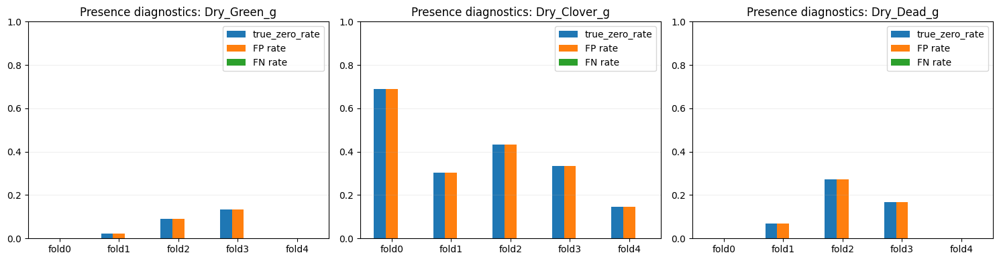

,fold,target,n,true_zero_rate,fp_rate,fn_rate
0,0,Dry_Green_g,61,0.000000,0.000000,0.0
1,0,Dry_Clover_g,61,0.688525,0.688525,0.0
2,0,Dry_Dead_g,61,0.000000,0.000000,0.0
3,1,Dry_Green_g,86,0.023256,0.023256,0.0
4,1,Dry_Clover_g,86,0.302326,0.302326,0.0
5,1,Dry_Dead_g,86,0.069767,0.069767,0.0
6,2,Dry_Green_g,88,0.090909,0.090909,0.0
7,2,Dry_Clover_g,88,0.431818,0.431818,0.0
8,2,Dry_Dead_g,88,0.272727,0.272727,0.0
9,3,Dry_Green_g,60,0.133333,0.133333,0.0


In [23]:
component_targets = ["Dry_Green_g", "Dry_Clover_g", "Dry_Dead_g"]
presence_summary = plot_presence_fp_fn_by_fold(score_df, component_targets, threshold=0.0)
display(presence_summary)

In [24]:
def plot_abs_error_boxplot_by_fold(
    score_df: pd.DataFrame,
    target_cols: List[str],
) -> None:
    """ターゲット別に abs error の分布を foldごとの箱ひげで見る。

    Args:
        score_df: build_image_score_df の出力
        target_cols: ターゲット名
    """
    folds_sorted = sorted(score_df["fold"].unique())
    nrows, ncols = 2, 3
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 4), squeeze=False)
    axes = axes.ravel()

    for j, t in enumerate(target_cols):
        ax = axes[j]
        data = [score_df.loc[score_df["fold"] == f, f"abs_err_{t}"].values for f in folds_sorted]
        ax.boxplot(data, labels=[f"f{f}" for f in folds_sorted], showfliers=False)
        ax.set_title(f"abs error by fold: {t}")
        ax.set_ylabel("|pred - true|")
        ax.grid(True, axis="y", alpha=0.2)

    for kk in range(len(target_cols), nrows * ncols):
        fig.delaxes(axes[kk])

    fig.tight_layout()
    plt.show()

/tmp/ipykernel_3333698/3702696823.py:19: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=[f"f{f}" for f in folds_sorted], showfliers=False)
/tmp/ipykernel_3333698/3702696823.py:19: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=[f"f{f}" for f in folds_sorted], showfliers=False)
/tmp/ipykernel_3333698/3702696823.py:19: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=[f"f{f}" for f in folds_sorted], showfliers=False)
/tmp/ipykernel_3333698/3702696823.py:19: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' s

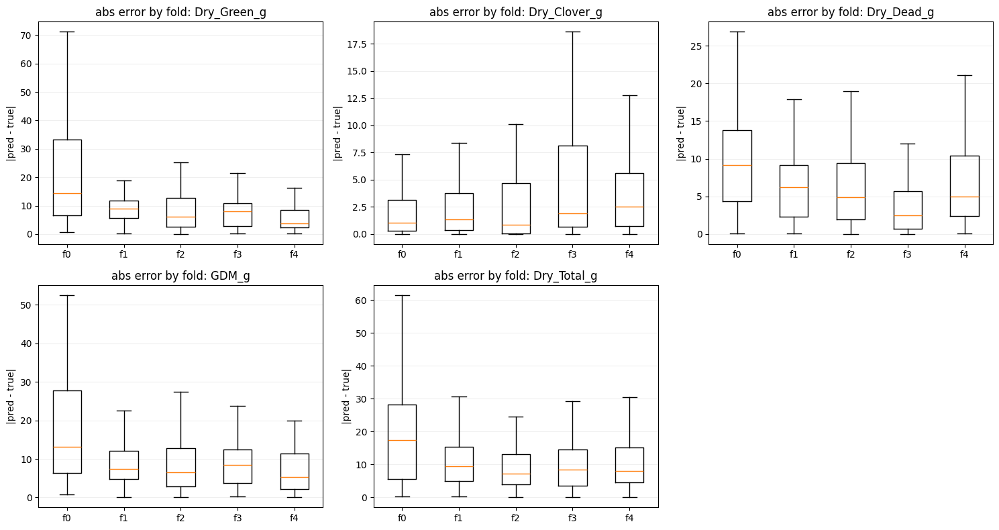

In [25]:
plot_abs_error_boxplot_by_fold(score_df, target_cols)

In [26]:
def plot_true_distribution_by_fold(
    score_df: pd.DataFrame,
    target_cols: List[str],
    *,
    use_log1p: bool = True,
    bins: int = 20,
) -> None:
    """ターゲットの真値分布をfold別に重ねて描く（分布差の確認用）.

    Args:
        score_df: build_image_score_df の出力
        target_cols: ターゲット名
        use_log1p: heavy tail 対策で log1p 表示するか
        bins: ヒストのbins
    """
    folds_sorted = sorted(score_df["fold"].unique())
    nrows, ncols = 2, 3
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 4), squeeze=False)
    axes = axes.ravel()

    for j, t in enumerate(target_cols):
        ax = axes[j]
        for f in folds_sorted:
            x = score_df.loc[score_df["fold"] == f, f"true_{t}"].values
            if use_log1p:
                x = np.log1p(np.clip(x, 0, None))
            ax.hist(x, bins=bins, alpha=0.35, label=f"fold{f}")

        ax.set_title(f"true distribution by fold: {t} ({'log1p' if use_log1p else 'raw'})")
        ax.grid(True, alpha=0.2)
        ax.legend()

    for kk in range(len(target_cols), nrows * ncols):
        fig.delaxes(axes[kk])

    fig.tight_layout()
    plt.show()

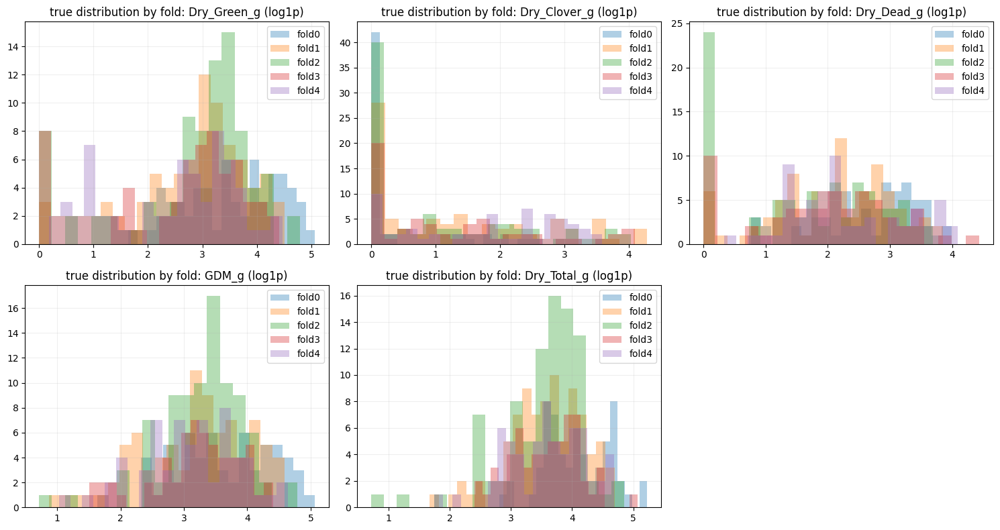

In [27]:
plot_true_distribution_by_fold(score_df, target_cols, use_log1p=True)

✅ merged df shape: (357, 18)


,image_id,pred_Dry_Green_g,true_Dry_Green_g,err_Dry_Green_g,pred_Dry_Clover_g,true_Dry_Clover_g,err_Dry_Clover_g,pred_Dry_Dead_g,true_Dry_Dead_g,err_Dry_Dead_g,pred_GDM_g,true_GDM_g,err_GDM_g,pred_Dry_Total_g,true_Dry_Total_g,err_Dry_Total_g,State,Sampling_Date
0,ID1035947949,13.632812,10.526099,3.106712,1.209109,0.4343,0.774809,12.023442,23.223902,-11.200459,14.841923,10.960501,3.881422,26.865364,34.184395,-7.319031,Tas,2015/9/11
1,ID105271783,37.656246,27.666702,9.989544,5.287635,5.2698,0.017835,16.656252,8.563501,8.092751,42.943882,32.936497,10.007385,59.600136,41.500000,18.100136,Vic,2015/6/30
2,ID1103883611,49.437496,82.783417,-33.345921,1.605469,0.0000,1.605469,20.802338,12.916600,7.885737,51.042973,82.783417,-31.740444,71.845314,95.699989,-23.854675,NSW,2015/2/24


📌 State別 global_weighted_r2（悪い順）


,State,n,global_weighted_r2
0,NSW,75,0.449387
1,Tas,138,0.643853
3,WA,32,0.652911
2,Vic,112,0.776316


📌 State×target の wSSE（大きいほど悪い）


,State,target,n,SSE,wSSE,RMSE,MAE,weight
4,NSW,Dry_Total_g,75,79654.813565,39827.406783,32.589326,23.214240,0.5
9,Tas,Dry_Total_g,138,28178.838277,14089.419139,14.289663,11.292114,0.5
3,NSW,GDM_g,75,70177.076383,14035.415277,30.589121,22.208343,0.2
14,Vic,Dry_Total_g,112,15281.941914,7640.970957,11.681006,9.071740,0.5
0,NSW,Dry_Green_g,75,75927.307648,7592.730765,31.817670,22.562066,0.1
13,Vic,GDM_g,112,15024.228300,3004.845660,11.582094,8.628737,0.2
8,Tas,GDM_g,138,13245.677248,2649.135450,9.797100,7.811744,0.2
19,WA,Dry_Total_g,32,4442.635121,2221.317560,11.782714,8.286946,0.5
5,Tas,Dry_Green_g,138,17923.831643,1792.383164,11.396615,8.228938,0.1
2,NSW,Dry_Dead_g,75,15651.600484,1565.160048,14.446038,10.628392,0.1


📌 State別（ターゲット別）wSSE のピボット


target,Dry_Clover_g,Dry_Dead_g,Dry_Green_g,Dry_Total_g,GDM_g
State,,,,,
NSW,210.510631,1565.160048,7592.730765,39827.406783,14035.415277
Tas,716.481663,1565.152442,1792.383164,14089.419139,2649.135450
Vic,502.506320,492.306379,1295.594832,7640.970957,3004.845660
WA,1107.726643,173.220224,522.413736,2221.317560,987.377311


📌 true_total bin別の誤差（小→大）


,bin,n,true_total_mean,true_total_median,pred_total_mean,MAE_total,RMSE_total,mean_weighted_sse_img,global_weighted_r2_in_bin
0,"(1.0390000000000001, 20.733]",60,14.042740,15.120001,23.919933,10.544004,13.218815,116.818308,-1.979892
1,"(20.733, 31.028]",59,25.592371,25.271498,30.820491,9.269274,12.207392,109.245129,-0.287998
2,"(31.028, 40.3]",60,35.341188,34.793901,34.126686,7.388840,9.153285,67.014471,0.565457
3,"(40.3, 50.807]",59,45.147801,45.265205,44.621127,9.280853,11.767652,132.204162,0.493296
4,"(50.807, 65.357]",59,57.665649,57.879997,55.265244,11.320540,14.220006,181.095441,0.571658
5,"(65.357, 185.7]",60,93.993028,89.505005,66.094786,29.037617,37.227757,1100.532818,0.283179


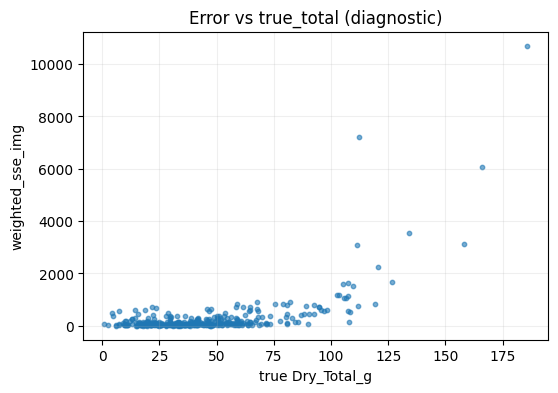

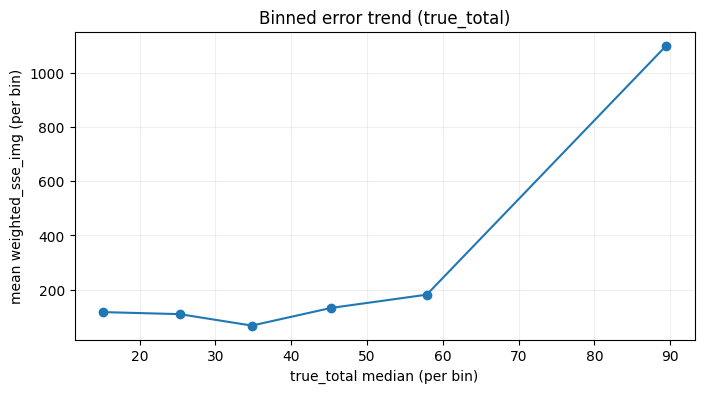

In [28]:
# ============================================================
# 📌 OOF分析：State別 / Total bin別 の誤差を診断する
# ============================================================
from __future__ import annotations
from typing import Dict, List, Tuple, Optional

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# あなたの utils に合わせて import（存在しない場合は下のfallbackが動きます）
try:
    from utils.metric import global_weighted_r2_score, r2_per_target
except Exception:
    # --- fallback（念のため）---
    def global_weighted_r2_score(y_true: np.ndarray, y_pred: np.ndarray, weights: np.ndarray) -> float:
        """公式の 'global weighted R²' 相当（全(target,row)をまとめてR²）。"""
        y_true = np.asarray(y_true, dtype=np.float64)
        y_pred = np.asarray(y_pred, dtype=np.float64)
        w = np.asarray(weights, dtype=np.float64)

        # (N,K) -> (N*K,)
        yt = y_true.reshape(-1)
        yp = y_pred.reshape(-1)

        # rowごとにweightを当てる（targetごとの重みを繰り返す）
        ww = np.tile(w, (y_true.shape[0],)).reshape(-1)

        # weighted SSE / SST
        sse = np.sum(ww * (yt - yp) ** 2)
        mu = np.sum(ww * yt) / np.sum(ww)
        sst = np.sum(ww * (yt - mu) ** 2)
        return float(1.0 - sse / sst) if sst > 0 else 0.0

    def r2_per_target(y_true: np.ndarray, y_pred: np.ndarray) -> np.ndarray:
        """ターゲットごとのR²（補助指標）。"""
        y_true = np.asarray(y_true, dtype=np.float64)
        y_pred = np.asarray(y_pred, dtype=np.float64)
        r2s = []
        for k in range(y_true.shape[1]):
            yt = y_true[:, k]
            yp = y_pred[:, k]
            sse = np.sum((yt - yp) ** 2)
            sst = np.sum((yt - np.mean(yt)) ** 2)
            r2s.append(float(1.0 - sse / sst) if sst > 0 else 0.0)
        return np.array(r2s, dtype=np.float64)

# ------------------------------------------------------------
# ✅ 1) 準備：OOFをDataFrame化 & メタ情報（State等）と結合
# ------------------------------------------------------------
def build_oof_df(
    ids: np.ndarray,
    preds: np.ndarray,
    targets: np.ndarray,
    target_cols: List[str],
) -> pd.DataFrame:
    """OOF配列を tidy な DataFrame に変換する。

    Args:
        ids: (N,) image_id の配列
        preds: (N,K) 予測（rawスケール）
        targets: (N,K) 正解（rawスケール）
        target_cols: ターゲット名（K個,順序は学習と同じ）

    Returns:
        oof_df: image_id + pred_* + true_* + err_* を持つDataFrame
    """
    oof_df = pd.DataFrame({"image_id": ids.astype(str)})

    for j, t in enumerate(target_cols):
        oof_df[f"pred_{t}"] = preds[:, j].astype(np.float64)
        oof_df[f"true_{t}"] = targets[:, j].astype(np.float64)
        oof_df[f"err_{t}"]  = oof_df[f"pred_{t}"] - oof_df[f"true_{t}"]

    return oof_df


# target_cols / weights の取り出し（cfgの形揺れに対応）
if "target_cols" not in globals():
    target_cols = cfg["target_cols"]

if isinstance(cfg, dict):
    # cfg["metric"]["weights"] or cfg["metric_weights"] などに対応
    if "metric" in cfg and isinstance(cfg["metric"], dict) and "weights" in cfg["metric"]:
        weights = np.array(cfg["metric"]["weights"], dtype=np.float64)
    else:
        weights = np.array([0.1, 0.1, 0.1, 0.2, 0.5], dtype=np.float64)
else:
    weights = np.array([0.1, 0.1, 0.1, 0.2, 0.5], dtype=np.float64)

# OOF df
oof_df = build_oof_df(ids, preds, targets, target_cols)

# df_pivot (polars) -> pandas にしてメタ結合
# ※ df_pivotはあなたのNotebookで polars で読んでいる想定
meta_cols = ["image_id", "State", "Sampling_Date"]
df_meta = df_pivot.select([c for c in meta_cols if c in df_pivot.columns]).to_pandas()

df_all = oof_df.merge(df_meta, on="image_id", how="left")

# 欠損チェック（Stateが取れてないと以降の分析ができない）
if df_all["State"].isna().any():
    n_miss = int(df_all["State"].isna().sum())
    print(f"[WARN] Stateが結合できていない行があります: {n_miss} rows")
    print("  -> image_idの一致（train時のid列）を確認してください。")

print("✅ merged df shape:", df_all.shape)
display(df_all.head(3))


# ------------------------------------------------------------
# ✅ 2) 便利：weighted SSE を計算（per-image / per-target）
# ------------------------------------------------------------
def add_weighted_sse_columns(df: pd.DataFrame, target_cols: List[str], weights: np.ndarray) -> pd.DataFrame:
    """dfに weighted SSE（画像単位）列を追加する。

    weighted_sse_img = Σ_k w_k * (pred_k - true_k)^2
    """
    wsse = np.zeros(len(df), dtype=np.float64)
    for j, t in enumerate(target_cols):
        e = (df[f"pred_{t}"].values - df[f"true_{t}"].values).astype(np.float64)
        wsse += weights[j] * (e ** 2)
    df = df.copy()
    df["weighted_sse_img"] = wsse
    return df

df_all = add_weighted_sse_columns(df_all, target_cols, weights)


# ============================================================
# ✅ 3) State別 global_weighted_r2
# ============================================================
def state_global_r2(df: pd.DataFrame, target_cols: List[str], weights: np.ndarray) -> pd.DataFrame:
    rows = []
    for st, g in df.groupby("State"):
        y_true = g[[f"true_{t}" for t in target_cols]].values
        y_pred = g[[f"pred_{t}" for t in target_cols]].values
        r2 = global_weighted_r2_score(y_true, y_pred, weights)
        rows.append({"State": st, "n": len(g), "global_weighted_r2": float(r2)})
    out = pd.DataFrame(rows).sort_values("global_weighted_r2")
    return out

state_r2_df = state_global_r2(df_all, target_cols, weights)
print("📌 State別 global_weighted_r2（悪い順）")
display(state_r2_df)


# ============================================================
# ✅ 4) State別 Weighted SSE（ターゲット別）
#    - SSE_k = Σ (err_k)^2
#    - weighted_SSE_k = w_k * SSE_k
# ============================================================
def state_target_sse(df: pd.DataFrame, target_cols: List[str], weights: np.ndarray) -> pd.DataFrame:
    rows = []
    for st, g in df.groupby("State"):
        for j, t in enumerate(target_cols):
            e = (g[f"pred_{t}"].values - g[f"true_{t}"].values).astype(np.float64)
            sse = float(np.sum(e ** 2))
            wsse = float(weights[j] * sse)
            rmse = float(np.sqrt(np.mean(e ** 2)))
            mae = float(np.mean(np.abs(e)))
            rows.append(
                {
                    "State": st,
                    "target": t,
                    "n": len(g),
                    "SSE": sse,
                    "wSSE": wsse,
                    "RMSE": rmse,
                    "MAE": mae,
                    "weight": float(weights[j]),
                }
            )
    return pd.DataFrame(rows)

state_sse_df = state_target_sse(df_all, target_cols, weights)

print("📌 State×target の wSSE（大きいほど悪い）")
display(state_sse_df.sort_values("wSSE", ascending=False).head(10))

print("📌 State別（ターゲット別）wSSE のピボット")
wsse_pivot = state_sse_df.pivot(index="State", columns="target", values="wSSE")
display(wsse_pivot)


# ============================================================
# ✅ 5) true_total（Dry_Total_g）bin別の誤差
# ============================================================
def total_bin_metrics(
    df: pd.DataFrame,
    target_cols: List[str],
    weights: np.ndarray,
    n_bins: int = 6,
) -> pd.DataFrame:
    """true_total の大きさ（qcut）でbin分けして誤差を集計する。

    見たいもの（例）：
    - 各binの件数
    - totalのMAE/RMSE
    - mean weighted_sse_img（画像単位の重み付き二乗誤差の平均）
    - bin内 global_weighted_r2（参考：小サンプルだとブレやすい）
    """
    df = df.copy()

    total_col = "true_Dry_Total_g"
    if total_col not in df.columns:
        raise KeyError(f"{total_col} が見つかりません。target_colsの順序/列名を確認してください。")

    # qcut（分位点で均等分割、重複binはdrop）
    df["total_bin"] = pd.qcut(df[total_col], q=n_bins, duplicates="drop")

    rows = []
    for b, g in df.groupby("total_bin", observed=True):
        y_true = g[[f"true_{t}" for t in target_cols]].values
        y_pred = g[[f"pred_{t}" for t in target_cols]].values
        r2 = global_weighted_r2_score(y_true, y_pred, weights)

        # totalの誤差
        e_total = (g["pred_Dry_Total_g"].values - g["true_Dry_Total_g"].values).astype(np.float64)
        mae_total = float(np.mean(np.abs(e_total)))
        rmse_total = float(np.sqrt(np.mean(e_total ** 2)))

        rows.append(
            {
                "bin": str(b),
                "n": len(g),
                "true_total_mean": float(g["true_Dry_Total_g"].mean()),
                "true_total_median": float(g["true_Dry_Total_g"].median()),
                "pred_total_mean": float(g["pred_Dry_Total_g"].mean()),
                "MAE_total": mae_total,
                "RMSE_total": rmse_total,
                "mean_weighted_sse_img": float(g["weighted_sse_img"].mean()),
                "global_weighted_r2_in_bin": float(r2),
            }
        )

    out = pd.DataFrame(rows)
    # totalが小さいbin→大きいbin順に並べたいので、中央値でsort
    out = out.sort_values("true_total_median").reset_index(drop=True)
    return out

bin_df = total_bin_metrics(df_all, target_cols, weights, n_bins=6)
print("📌 true_total bin別の誤差（小→大）")
display(bin_df)


# ============================================================
# ✅ 6) （任意）可視化：true_total と weighted_sse_img の関係
# ============================================================
plt.figure(figsize=(6, 4))
plt.scatter(df_all["true_Dry_Total_g"], df_all["weighted_sse_img"], s=10, alpha=0.6)
plt.xlabel("true Dry_Total_g")
plt.ylabel("weighted_sse_img")
plt.grid(True, alpha=0.2)
plt.title("Error vs true_total (diagnostic)")
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(bin_df["true_total_median"].values, bin_df["mean_weighted_sse_img"].values, marker="o")
plt.xlabel("true_total median (per bin)")
plt.ylabel("mean weighted_sse_img (per bin)")
plt.grid(True, alpha=0.2)
plt.title("Binned error trend (true_total)")
plt.show()

✅ target_cols: ['Dry_Green_g', 'Dry_Clover_g', 'Dry_Dead_g', 'GDM_g', 'Dry_Total_g']
✅ weights    : [0.1 0.1 0.1 0.2 0.5]
✅ df_all shape: (357, 19)
(357, 19)


,image_id,pred_Dry_Green_g,true_Dry_Green_g,err_Dry_Green_g,pred_Dry_Clover_g,true_Dry_Clover_g,err_Dry_Clover_g,pred_Dry_Dead_g,true_Dry_Dead_g,err_Dry_Dead_g,pred_GDM_g,true_GDM_g,err_GDM_g,pred_Dry_Total_g,true_Dry_Total_g,err_Dry_Total_g,State,Sampling_Date,weighted_sse_img
0,ID1035947949,13.632812,10.526099,3.106712,1.209109,0.4343,0.774809,12.023442,23.223902,-11.200459,14.841923,10.960501,3.881422,26.865364,34.184395,-7.319031,Tas,2015/9/11,43.367421
1,ID105271783,37.656246,27.666702,9.989544,5.287635,5.2698,0.017835,16.656252,8.563501,8.092751,42.943882,32.936497,10.007385,59.600136,41.500000,18.100136,Vic,2015/6/30,200.365402
2,ID1103883611,49.437496,82.783417,-33.345921,1.605469,0.0000,1.605469,20.802338,12.916600,7.885737,51.042973,82.783417,-31.740444,71.845314,95.699989,-23.854675,NSW,2015/2/24,603.685206



📌 Global weighted R2 (OOF overall): 0.643494

📌 State別 true_total 分布サマリ（median順）
(4, 9)


,State,n,mean,median,p75,p90,p95,max,min
3,WA,32,31.387501,32.269999,46.952501,58.037990,58.924998,72.170013,1.0400
1,Tas,138,36.798352,32.812799,49.347202,64.832030,76.253814,107.985886,4.3000
2,Vic,112,42.666858,40.229996,52.452505,69.060004,84.739004,108.250000,10.1912
0,NSW,75,70.897335,63.299988,93.799995,111.940009,128.809995,185.700012,7.6000


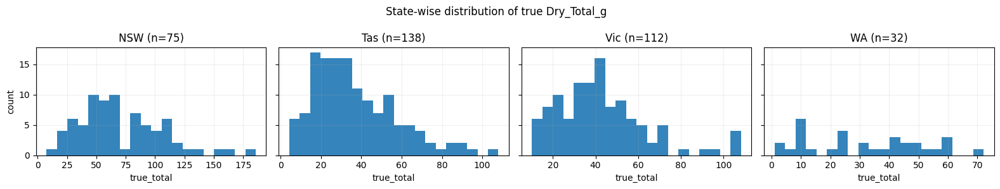

<Figure size 600x400 with 0 Axes>

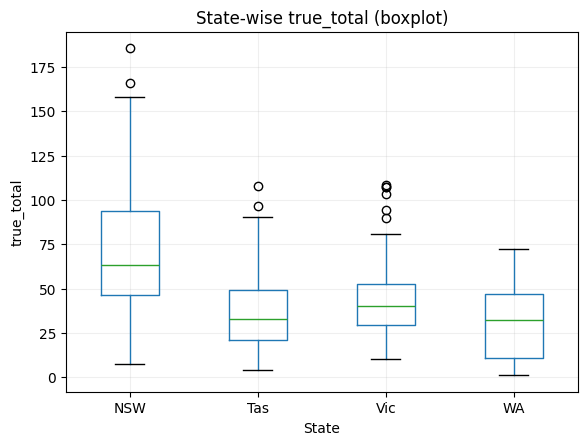


📌 Focus State='NSW'  n=75

🔥 NSW WORST 15（weighted_sse_img 大きい順）


,image_id,Sampling_Date,true_Dry_Total_g,pred_Dry_Total_g,err_Dry_Total_g,weighted_sse_img
39,ID384648061,2015/10/6,185.700012,64.386169,-121.313843,10701.265076
160,ID1357758282,2015/1/15,112.100006,17.064386,-95.035620,7199.844284
54,ID746335827,2015/10/6,166.099976,68.613335,-97.486641,6075.379371
20,ID157479394,2015/2/24,134.199966,72.682487,-61.517479,3549.036645
238,ID1139866256,2015/5/7,157.899979,84.648491,-73.251488,3131.866729
3,ID1121692672,2015/2/24,111.200005,55.837616,-55.362389,3063.095107
17,ID1540480250,2015/2/24,120.400002,77.655609,-42.744392,2223.376201
182,ID1859251563,2015/1/15,126.500008,79.233536,-47.266472,1659.062399
40,ID407646960,2015/2/25,107.500023,58.610714,-48.889309,1617.289033
30,ID2052993274,2015/2/24,105.400024,66.692337,-38.707687,1604.079679



📌 WORST群でのターゲット別 wSSE 合計（どれが支配的？）


,sum_wSSE



📌 State×total_bin の誤差テーブル
(24, 9)


/tmp/ipykernel_3333698/3098075046.py:239: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_group_metrics)


,State,total_bin,n,true_total_median,mean_weighted_sse_img,sum_weighted_sse_img,MAE_total,RMSE_total,global_weighted_r2_in_group
0,NSW,"(1.0390000000000001, 20.733]",1.0,7.600000,572.677629,572.677629,29.658518,29.658518,-60.967362
1,NSW,"(20.733, 31.028]",7.0,24.800001,262.739049,1839.173340,17.438320,20.106873,-1.705124
2,NSW,"(31.028, 40.3]",6.0,35.299999,57.585717,345.514305,8.068030,9.416933,0.624332
3,NSW,"(40.3, 50.807]",12.0,46.749998,81.062527,972.750318,5.704874,7.701540,0.708139
4,NSW,"(50.807, 65.357]",17.0,59.900013,264.969844,4504.487349,14.313945,17.283659,0.471829
5,NSW,"(65.357, 185.7]",32.0,100.549988,1718.644393,54996.620563,38.410548,46.644608,0.092540
6,Tas,"(1.0390000000000001, 20.733]",32.0,16.019249,126.427452,4045.678465,11.608086,13.971366,-2.424603
7,Tas,"(20.733, 31.028]",31.0,25.499998,121.530369,3767.441449,10.451245,12.873662,-0.501203
8,Tas,"(31.028, 40.3]",26.0,34.353050,73.279450,1905.265688,7.632104,9.585852,0.515258
9,Tas,"(40.3, 50.807]",16.0,45.460003,164.215938,2627.455003,11.647724,14.692632,0.381783



📌 (Pivot) mean_weighted_sse_img  ※高いほど悪い
(4, 6)


total_bin,"(1.0390000000000001, 20.733]","(20.733, 31.028]","(31.028, 40.3]","(40.3, 50.807]","(50.807, 65.357]","(65.357, 185.7]"
State,,,,,,
NSW,572.677629,262.739049,57.585717,81.062527,264.969844,1718.644393
Tas,126.427452,121.530369,73.279450,164.215938,127.714133,431.440194
Vic,132.196812,36.012861,50.384683,103.458169,88.325697,378.981966
WA,25.053947,56.657291,140.213970,245.263452,432.742515,68.420272



📌 (Pivot) n（各セルのサンプル数）
(4, 6)


total_bin,"(1.0390000000000001, 20.733]","(20.733, 31.028]","(31.028, 40.3]","(40.3, 50.807]","(50.807, 65.357]","(65.357, 185.7]"
State,,,,,,
NSW,1.0,7.0,6.0,12.0,17.0,32.0
Tas,32.0,31.0,26.0,16.0,19.0,14.0
Vic,16.0,17.0,24.0,24.0,18.0,13.0
WA,11.0,4.0,4.0,7.0,5.0,1.0



📌 (Pivot) global_weighted_r2_in_group  ※小さいほど悪い/ブレやすい
(4, 6)


total_bin,"(1.0390000000000001, 20.733]","(20.733, 31.028]","(31.028, 40.3]","(40.3, 50.807]","(50.807, 65.357]","(65.357, 185.7]"
State,,,,,,
NSW,-60.967362,-1.705124,0.624332,0.708139,0.471829,0.092540
Tas,-2.424603,-0.501203,0.515258,0.381783,0.654738,0.492876
Vic,-2.292355,0.581198,0.669999,0.549450,0.755237,0.629914
WA,0.247032,0.299641,0.200591,0.229015,0.168207,0.917799


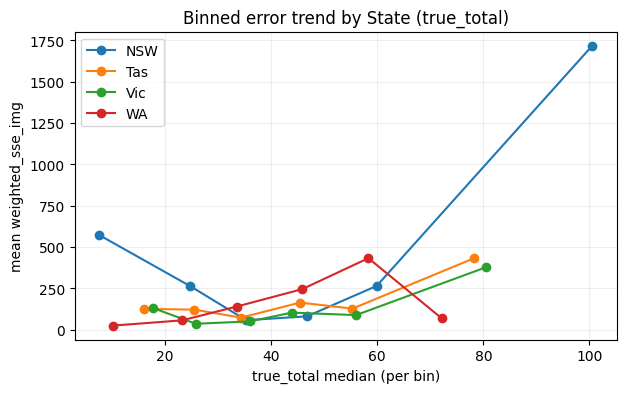

In [29]:
# ============================================================
# ✅ OOF診断（そのまま貼って実行OK）
#   1) State別 true_total 分布（要約 + 図）
#   2) NSW worst一覧（weighted_sse_img 上位）
#   3) State×true_total bin の誤差テーブル（count / mean / sum / global_r2）
# ============================================================
from typing import Dict, List, Optional

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- display() fallback（Colab/Kaggle/Jupyterで動く）----
try:
    from IPython.display import display
except Exception:
    display = print

# ---- 競技の global weighted R2（utilsが無い場合も動くfallback付き）----
try:
    from utils.metric import global_weighted_r2_score
except Exception:
    def global_weighted_r2_score(y_true: np.ndarray, y_pred: np.ndarray, weights: np.ndarray) -> float:
        """
        公式説明に合わせた "global weighted R²"（全(image,target)を1つにflattenして計算）
        R2 = 1 - Σ w*(y-ŷ)^2 / Σ w*(y-ȳ_w)^2
        """
        y_true = np.asarray(y_true, dtype=np.float64)
        y_pred = np.asarray(y_pred, dtype=np.float64)
        w = np.asarray(weights, dtype=np.float64)

        yt = y_true.reshape(-1)
        yp = y_pred.reshape(-1)
        ww = np.tile(w, y_true.shape[0]).reshape(-1)

        sse = np.sum(ww * (yt - yp) ** 2)
        mu = np.sum(ww * yt) / np.sum(ww)
        sst = np.sum(ww * (yt - mu) ** 2)
        return float(1.0 - sse / sst) if sst > 0 else 0.0


# ============================================================
# 🔧 Settings（必要ならここだけ変える）
# ============================================================
WORST_N = 15
N_BINS = 6
STATE_FOCUS = "NSW"  # worst確認したい州

# ============================================================
# ✅ 前提変数チェック
# ============================================================
required = ["cfg", "df_pivot", "ids", "preds", "targets"]
missing = [x for x in required if x not in globals()]
if missing:
    raise NameError(f"❌ Notebook内に必要な変数がありません: {missing}\n"
                    "先に cfg/df_pivot/ids/preds/targets を読み込むセルを実行してください。")

# target_cols / weights 取得（cfgの形揺れ対応）
target_cols: List[str] = list(cfg["target_cols"]) if isinstance(cfg, dict) else list(cfg.target_cols)

if isinstance(cfg, dict) and "metric" in cfg and isinstance(cfg["metric"], dict) and "weights" in cfg["metric"]:
    weights = np.array(cfg["metric"]["weights"], dtype=np.float64)
else:
    # fallback（あなたのコンペ設定）
    weights = np.array([0.1, 0.1, 0.1, 0.2, 0.5], dtype=np.float64)

print("✅ target_cols:", target_cols)
print("✅ weights    :", weights)

# ============================================================
# ✅ df_all を作る（無ければ自動作成）
# ============================================================
if "df_all" not in globals():
    # --- OOF配列 -> DataFrame（pred/true/err） ---
    oof_df = pd.DataFrame({"image_id": np.asarray(ids).astype(str)})
    for j, t in enumerate(target_cols):
        oof_df[f"pred_{t}"] = np.asarray(preds)[:, j].astype(np.float64)
        oof_df[f"true_{t}"] = np.asarray(targets)[:, j].astype(np.float64)
        oof_df[f"err_{t}"]  = oof_df[f"pred_{t}"] - oof_df[f"true_{t}"]

    # --- meta結合（polars -> pandas）---
    meta_cols = ["image_id", "image_path", "State", "Sampling_Date", "Species"]
    meta_cols = [c for c in meta_cols if c in df_pivot.columns]
    df_meta = df_pivot.select(meta_cols).to_pandas()

    df_all = oof_df.merge(df_meta, on="image_id", how="left")

    # --- weighted_sse_img を追加（画像単位の重み付き二乗誤差）---
    wsse_img = np.zeros(len(df_all), dtype=np.float64)
    for j, t in enumerate(target_cols):
        e = df_all[f"err_{t}"].values.astype(np.float64)
        df_all[f"sse_{t}"] = e ** 2
        df_all[f"wsse_{t}"] = weights[j] * (e ** 2)
        wsse_img += df_all[f"wsse_{t}"].values
    df_all["weighted_sse_img"] = wsse_img

print("✅ df_all shape:", df_all.shape)
show_df(df_all)


# ============================================================
# 0) 全体スコア確認（このfoldのOOFに対するglobal）
# ============================================================
y_true_all = df_all[[f"true_{t}" for t in target_cols]].values
y_pred_all = df_all[[f"pred_{t}" for t in target_cols]].values
global_r2_all = global_weighted_r2_score(y_true_all, y_pred_all, weights)
print(f"\n📌 Global weighted R2 (OOF overall): {global_r2_all:.6f}")


# ============================================================
# 1) State別 true_total 分布（要約 + 図）
# ============================================================
TOTAL_T = "Dry_Total_g"
true_total_col = f"true_{TOTAL_T}"
pred_total_col = f"pred_{TOTAL_T}"
err_total_col  = f"err_{TOTAL_T}"

if true_total_col not in df_all.columns:
    raise KeyError(f"❌ {true_total_col} が df_all にありません。target_cols に {TOTAL_T} があるか確認してください。")

def _q(p: float):
    return lambda x: float(np.quantile(x, p))

state_total_summary = (
    df_all.groupby("State")[true_total_col]
    .agg(
        n="count",
        mean="mean",
        median="median",
        p75=_q(0.75),
        p90=_q(0.90),
        p95=_q(0.95),
        max="max",
        min="min",
    )
    .reset_index()
    .sort_values("median")
)

print("\n📌 State別 true_total 分布サマリ（median順）")
show_df(state_total_summary, 10)

# --- 図：State別ヒストグラム（true_total）---
states = [s for s in sorted(df_all["State"].dropna().unique())]
fig, axes = plt.subplots(1, len(states), figsize=(4 * len(states), 3), sharey=True)
if len(states) == 1:
    axes = [axes]

for ax, st in zip(axes, states):
    x = df_all.loc[df_all["State"] == st, true_total_col].values
    ax.hist(x, bins=20, alpha=0.9)
    ax.set_title(f"{st} (n={len(x)})")
    ax.set_xlabel("true_total")
    ax.grid(True, alpha=0.2)

axes[0].set_ylabel("count")
plt.suptitle("State-wise distribution of true Dry_Total_g")
plt.tight_layout()
plt.show()

# --- 図：State別箱ひげ（true_total）---
plt.figure(figsize=(6, 4))
df_all.boxplot(column=true_total_col, by="State")
plt.title("State-wise true_total (boxplot)")
plt.suptitle("")  # pandasが付ける余計なタイトル消し
plt.ylabel("true_total")
plt.grid(True, alpha=0.2)
plt.show()


# ============================================================
# 2) NSW（など特定State）の worst 一覧
# ============================================================
if "State" not in df_all.columns:
    print("[WARN] State列が無いので、State別分析はスキップします。")
else:
    df_focus = df_all[df_all["State"] == STATE_FOCUS].copy()
    print(f"\n📌 Focus State='{STATE_FOCUS}'  n={len(df_focus)}")

    if len(df_focus) == 0:
        print(f"[WARN] {STATE_FOCUS} が df_all に存在しません。")
    else:
        worst = df_focus.sort_values("weighted_sse_img", ascending=False).head(WORST_N)

        cols_show = [
            "image_id",
            "image_path" if "image_path" in worst.columns else None,
            "Sampling_Date" if "Sampling_Date" in worst.columns else None,
            "Species" if "Species" in worst.columns else None,
            true_total_col,
            pred_total_col,
            err_total_col,
            "weighted_sse_img",
        ]
        cols_show = [c for c in cols_show if c is not None]

        print(f"\n🔥 {STATE_FOCUS} WORST {WORST_N}（weighted_sse_img 大きい順）")
        display(worst[cols_show])

        # ついでに：worstのターゲット別 wsse を合計して「何が効いているか」見る
        wsse_cols = [f"wsse_{t}" for t in target_cols if f"wsse_{t}" in worst.columns]
        contrib = worst[wsse_cols].sum().sort_values(ascending=False)
        contrib.index = [c.replace("wsse_", "") for c in contrib.index]
        print("\n📌 WORST群でのターゲット別 wSSE 合計（どれが支配的？）")
        display(contrib.to_frame("sum_wSSE"))


# ============================================================
# 3) State × true_total bin の誤差テーブル
#    - count
#    - mean/sum weighted_sse_img
#    - totalのMAE/RMSE
#    - bin内 global_weighted_r2
# ============================================================
df_bins = df_all.copy()
df_bins["total_bin"] = pd.qcut(df_bins[true_total_col], q=N_BINS, duplicates="drop")

def _group_metrics(g: pd.DataFrame) -> pd.Series:
    y_true = g[[f"true_{t}" for t in target_cols]].values
    y_pred = g[[f"pred_{t}" for t in target_cols]].values
    r2 = global_weighted_r2_score(y_true, y_pred, weights)

    e_total = (g[pred_total_col].values - g[true_total_col].values).astype(np.float64)
    mae_total = float(np.mean(np.abs(e_total)))
    rmse_total = float(np.sqrt(np.mean(e_total ** 2)))

    return pd.Series({
        "n": len(g),
        "true_total_median": float(g[true_total_col].median()),
        "mean_weighted_sse_img": float(g["weighted_sse_img"].mean()),
        "sum_weighted_sse_img": float(g["weighted_sse_img"].sum()),
        "MAE_total": mae_total,
        "RMSE_total": rmse_total,
        "global_weighted_r2_in_group": float(r2),
    })

state_bin_df = (
    df_bins.groupby(["State", "total_bin"], observed=True)
    .apply(_group_metrics)
    .reset_index()
    .sort_values(["State", "true_total_median"])
)

print("\n📌 State×total_bin の誤差テーブル")
show_df(state_bin_df, 10)

print("\n📌 (Pivot) mean_weighted_sse_img  ※高いほど悪い")
pivot_mean = state_bin_df.pivot(index="State", columns="total_bin", values="mean_weighted_sse_img")
show_df(pivot_mean, 10)

print("\n📌 (Pivot) n（各セルのサンプル数）")
pivot_n = state_bin_df.pivot(index="State", columns="total_bin", values="n")
show_df(pivot_n, 10)

print("\n📌 (Pivot) global_weighted_r2_in_group  ※小さいほど悪い/ブレやすい")
pivot_r2 = state_bin_df.pivot(index="State", columns="total_bin", values="global_weighted_r2_in_group")
show_df(pivot_r2, 10)

# --- 図：各Stateのbinごとの mean_weighted_sse_img の推移 ---
plt.figure(figsize=(7, 4))
for st in sorted(state_bin_df["State"].dropna().unique()):
    g = state_bin_df[state_bin_df["State"] == st].sort_values("true_total_median")
    plt.plot(g["true_total_median"].values, g["mean_weighted_sse_img"].values, marker="o", label=str(st))
plt.xlabel("true_total median (per bin)")
plt.ylabel("mean weighted_sse_img")
plt.title("Binned error trend by State (true_total)")
plt.grid(True, alpha=0.2)
plt.legend()
plt.show()